![](../docs/banner.png)

# Chapter 2: Visualizing and modelling spatial data

**Tomas Beuzen, 2021**

![](img/space.png)

## Chapter Outline
<hr>

<div class="toc"><ul class="toc-item"><li><span><a href="#Chapter-Learning-Objectives" data-toc-modified-id="Chapter-Learning-Objectives-2">Chapter Learning Objectives</a></span></li><li><span><a href="#Imports" data-toc-modified-id="Imports-3">Imports</a></span></li><li><span><a href="#1.-Spatial-visualization" data-toc-modified-id="1.-Spatial-visualization-4">1. Spatial visualization</a></span></li><li><span><a href="#2.-Spatial-modelling" data-toc-modified-id="2.-Spatial-modelling-5">2. Spatial modelling</a></span></li></ul></div>

## Chapter Learning Objectives
<hr>

- Make informed choices about how to plot your spatial data, e.g., scattered, polygons, 3D, etc..
- Plot spatial data using libraries such as `geopandas`, `plotly`, and `keplergl`.
- Interpolate unobserved spatial data using deterministic methods such as nearest-neighbour interpolation.
- Interpolate data from one set of polygons to a different set of polygons using areal interpolation.

## Imports
<hr>

In [ ]:
import warnings
!pip install keplergl
!pip install ipywidgets
import keplergl
import numpy as np
import osmnx as ox
import pandas as pd
import geopandas as gpd
import plotly.express as px
!pip install scikit-gstat
from skgstat import Variogram
import matplotlib.pyplot as plt
from shapely.geometry import Point
!pip install PyKrige
from pykrige.ok import OrdinaryKriging
from scipy.interpolate import NearestNDInterpolator
from tobler.area_weighted import area_interpolate
# Custom functions
from scripts.utils import pixel2poly
# Plotting defaults
plt.style.use('ggplot')
px.defaults.height = 400; px.defaults.width = 620
plt.rcParams.update({'font.size': 16, 'axes.labelweight': 'bold', 'figure.figsize': (6, 6), 'axes.grid': False})

## 1. Spatial visualization
<hr>

### 1.1. Geopandas

We saw last chapter how to easily plot geospatial data using the `geopandas` method `.plot()`. This workflow is useful for making quick plots, exploring your data, and easily layering geometries. Let's import some data of my hometown university using `osmnx` (our Python API for accessing OpenStreetMap data) and make a quick plot:

In [2]:
dundee_uni= (ox.geometries_from_place("University of Dundee, Dundee", tags={'building':True})
         .loc[:, ["geometry"]]                 # just keep the geometry column for now
         .query("geometry.type == 'Polygon'")  # only what polygons (buidling footprints)
         .assign(Label="Building Footprints")  # assign a label for later use
         .reset_index(drop=True)               # reset to 0 integer indexing
      )
dundee_uni.head()

/tmp/ipykernel_163/1815836891.py:1: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  dundee_uni= (ox.geometries_from_place("University of Dundee, Dundee", tags={'building':True})


,geometry,Label
0,"POLYGON ((-2.98247 56.45795, -2.98242 56.45790...",Building Footprints
1,"POLYGON ((-2.98158 56.45789, -2.98167 56.45797...",Building Footprints
2,"POLYGON ((-2.98084 56.45925, -2.98029 56.45882...",Building Footprints
3,"POLYGON ((-2.98300 56.45825, -2.98345 56.45863...",Building Footprints
4,"POLYGON ((-2.98559 56.45785, -2.98585 56.45806...",Building Footprints


Recall that we can make a plot using the `.plot()` method on a `GeoDataFrame`:

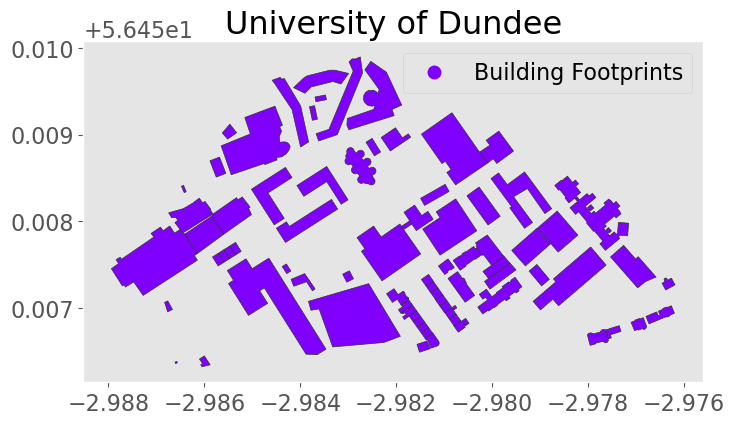

In [3]:
ax = dundee_uni.plot(figsize=(8, 8), column="Label", legend=True,
              edgecolor="0.2", markersize=200, cmap="rainbow")
plt.title("University of Dundee");

Say I know the "point" location of a particular campus building, but I want to locate the building footprint (a "polygon"). That's easily done with `geopandas`!

First, I'll use `shapely` (the Python geometry library `geopandas` is built on) to make my point, but you could also use the `geopandas` function `gpd.points_from_xy()` like we did last chapter:

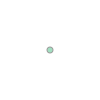

In [4]:
accy_dept = Point(-2.9795002730430085, 56.45724043914764)
accy_dept

Now, I can use the `.contains()` method to find out which building footprint the department of Accountancy office resides in:

In [5]:
dundee_uni[dundee_uni.contains(accy_dept)]

,geometry,Label
65,"POLYGON ((-2.97952 56.45719, -2.97965 56.45714...",Building Footprints


Looks like it's index 65! I'm going to change the label of that one to "Department of Accountancy":

In [6]:
dundee_uni.loc[65, "Label"] = "Department of Accountancy"

Now let's make a plot!

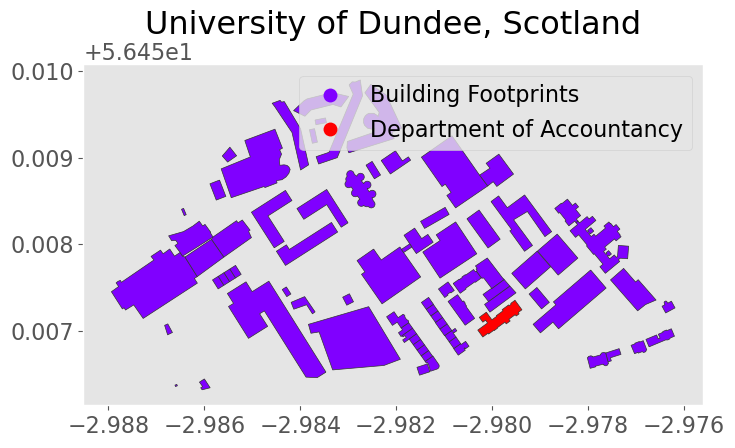

In [7]:
ax = dundee_uni.plot(figsize=(8, 8), column="Label", legend=True,
              edgecolor="0.2", markersize=200, cmap="rainbow")
plt.title("University of Dundee, Scotland");

We can add more detail to this map by including a background map. For this, we need to install the [contextily](https://github.com/geopandas/contextily) package. Note that most web providers use the Web Mercator projection, "EPSG:3857" ([interesting article on that here](https://www.esri.com/arcgis-blog/products/arcgis-pro/mapping/mercator-its-not-hip-to-be-square/)) so I'll convert to that before plotting:

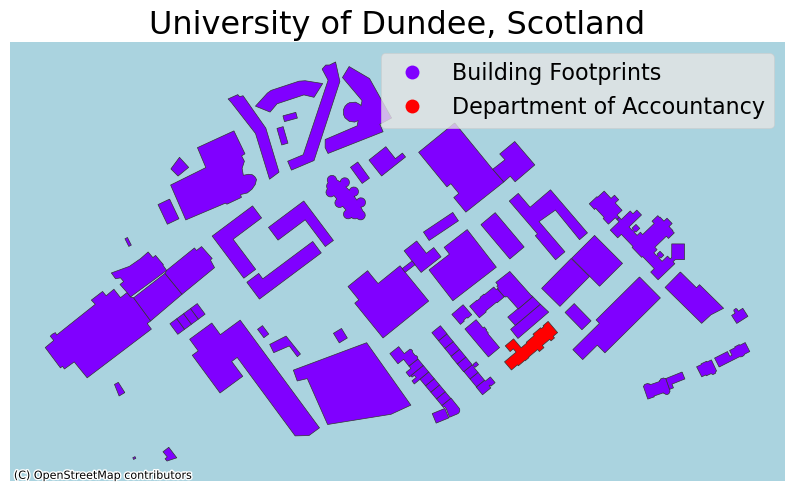

In [8]:
import contextily as ctx

ax = (dundee_uni.to_crs("EPSG:29901")
         .plot(figsize=(10, 8), column="Label", legend=True,
               edgecolor="0.2", markersize=200, cmap="rainbow")
     )
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)  # I'm using OSM as the source. See all provides with ctx.providers
plt.axis("off")
plt.title("University of Dundee, Scotland");

### 1.2. Plotly

The above map is nice, but it sure would be helpful in some cases to have interactive functionality for our map don't you think? Like the ability to zoom and pan? Well there are several packages out there that can help us with that, but `plotly` is one of the best for this kind of mapping. `plotly` supports plotting of maps backed by [MapBox](https://www.mapbox.com/) (a mapping and location data cloud platform).

Here's an example using the `plotly.express` function `px.choropleth_mapbox()`:

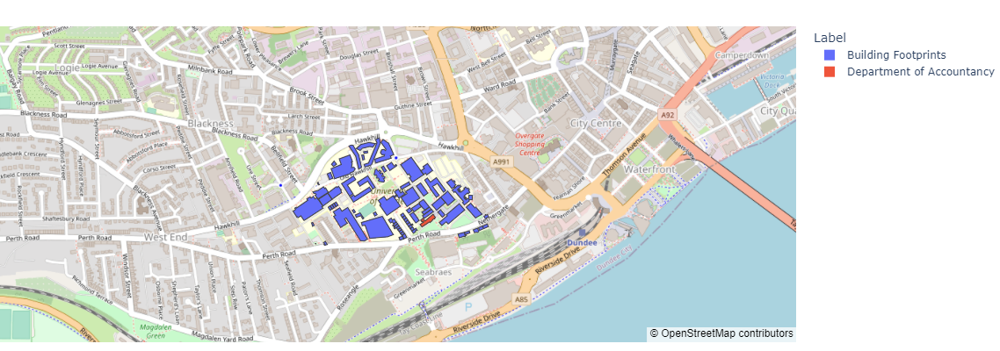

In [9]:
fig = px.choropleth_mapbox(dundee_uni, geojson=dundee_uni.geometry, locations=dundee_uni.index, color="Label",
                           center={"lat": 56.458351380081645, "lon": -2.981627818180416}, zoom=13.7,
                           mapbox_style="open-street-map")
fig.update_layout(margin=dict(l=0, r=0, t=30, b=10))

You can pan and zoom above as you desire! How about we add a terrain map instead:

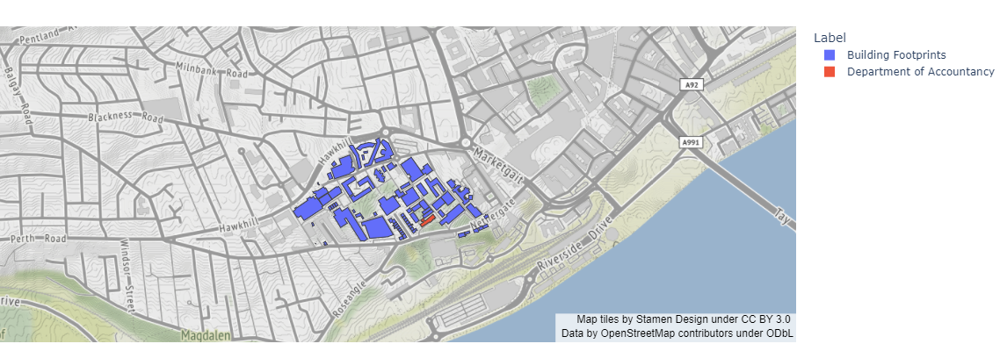

In [10]:
fig = px.choropleth_mapbox(dundee_uni, geojson=dundee_uni.geometry, locations=dundee_uni.index, color="Label",
                           center={"lat": 56.458351380081645, "lon": -2.981627818180416}, zoom=13.7,
                           mapbox_style="stamen-terrain")
fig.update_layout(margin=dict(l=0, r=0, t=30, b=10))

We are just colouring our geometries based on a label at the moment, but we could of course do some cooler things. Let's colour by building area:

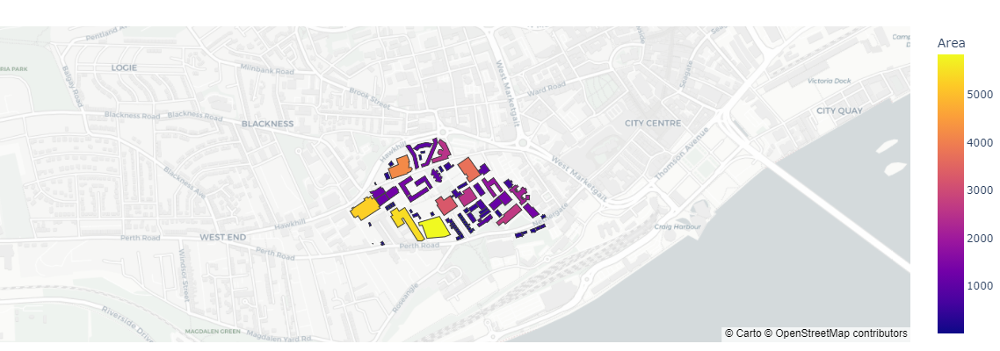

In [11]:
# Calculate area
dundee_uni["Area"] = dundee_uni.to_crs(epsg=27700).area  # note I'm projecting to EPSG:27700 

# Make plot
fig = px.choropleth_mapbox(dundee_uni, geojson=dundee_uni.geometry, locations=dundee_uni.index, color="Area",
                           center={"lat": 56.458351380081645, "lon": -2.981627818180416}, zoom=13.7,
                           mapbox_style="carto-positron")
fig.update_layout(margin=dict(l=0, r=0, t=30, b=10))

Check out the `plotly` [documentation](https://plotly.com/python/maps/) for more - there are many plotting options and examples to learn from! Other popular map plotting options include [altair](https://altair-viz.github.io/gallery/index.html#maps) ([doesn't support interactivity yet](https://github.com/vega/vega-lite/issues/3306)), [folium](https://python-visualization.github.io/folium/), and [bokeh](https://docs.bokeh.org/en/latest/docs/user_guide/geo.html).

### 1.3. Kepler.gl

In [ ]:
from keplergl import KeplerGl

In [4]:
ubc = (ox.geometries_from_place("University of British Columbia, Canada", tags={'building':True})
         .loc[:, ["geometry"]]                 # just keep the geometry column for now
         .query("geometry.type == 'Polygon'")  # only what polygons (buidling footprints)
         .assign(Label="Building Footprints")  # assign a label for later use
         .reset_index(drop=True)               # reset to 0 integer indexing
      )
ubc.head()

/tmp/ipykernel_696/1915534484.py:1: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  ubc = (ox.geometries_from_place("University of British Columbia, Canada", tags={'building':True})


,geometry,Label
0,"POLYGON ((-123.25526 49.26695, -123.25506 49.2...",Building Footprints
1,"POLYGON ((-123.25328 49.26803, -123.25335 49.2...",Building Footprints
2,"POLYGON ((-123.25531 49.26859, -123.25493 49.2...",Building Footprints
3,"POLYGON ((-123.25403 49.26846, -123.25408 49.2...",Building Footprints
4,"POLYGON ((-123.25455 49.26906, -123.25398 49.2...",Building Footprints


The above mapping was pretty cool, but are you ready for more power?

![](img/thanos.gif)

Time to introduce [kepler.gl](https://docs.kepler.gl/)! `keplergl` is a web-based tool for visualing spatial data. Luckily, it has a nice Python API and Jupyter extension for us to use (see the [install instructions](https://docs.kepler.gl/docs/keplergl-jupyter#install)). The basic way `keplergl` works is:
1. We create an instance of a map with `keplergl.KeplerGl()`
2. We add as much data to the map as we like with the `.add_data()` method
3. We customize and configure the map in any way we like using the GUI (graphical user interface)

In [5]:
ubc_map = keplergl.KeplerGl(height=500)
ubc_map.add_data(data=ubc.copy(), name="Building heights")
ubc_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Building heights': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18…

Let's add a 3D element to our plot! I'm going to load in some data of UBC building heights I downloaded from the [City of Vancouver Open Data Portal](https://opendata.vancouver.ca/explore/dataset/building-footprints-2009/information/):

In [6]:
ubc_bldg_heights = gpd.read_file("data-spatial/ubc-building-footprints-2009")
ubc_bldg_heights.head()

,id,orient8,bldgid,topelev_m,med_slope,baseelev_m,hgt_agl,rooftype,area_m2,avght_m,minht_m,maxht_m,base_m,len,wid,geometry
0,158502.0,26.7542,112433.0,97.55,4.0,80.01,17.54,Flat,2085.07,13.70,0.00,21.76,81.40,110.61,41.11,"POLYGON ((-123.25550 49.26127, -123.25544 49.2..."
1,158503.0,26.7542,112433.0,100.58,13.0,81.50,19.08,Flat,2085.07,13.70,0.00,21.76,81.40,110.61,41.11,"POLYGON ((-123.25561 49.26111, -123.25578 49.2..."
2,158506.0,27.5790,112852.0,122.32,5.0,93.04,29.28,Flat,4116.37,18.02,0.03,30.55,93.73,67.22,66.37,"POLYGON ((-123.24859 49.26136, -123.24850 49.2..."
3,158508.0,28.2727,120767.0,109.85,1.0,90.51,19.33,Flat,5667.17,17.95,0.17,31.16,89.19,155.53,59.50,"POLYGON ((-123.25340 49.26482, -123.25351 49.2..."
4,158509.0,28.5496,122507.0,112.69,27.0,86.63,26.07,Pitched,1349.35,18.26,0.00,27.34,87.79,64.92,26.47,"POLYGON ((-123.25520 49.26655, -123.25524 49.2..."


I'm going to combine this with our `ubc` data and do a bit of clean-up and wrangling. You'll do this workflow in your lab too so I won't spend too much time here:

In [7]:
ubc_bldg_heights = (gpd.sjoin(ubc, ubc_bldg_heights[["hgt_agl", "geometry"]], how="inner")
                       .drop(columns="index_right")
                       .rename(columns={"hgt_agl": "Height"})
                       .reset_index()
                       .dissolve(by="index", aggfunc="mean")  # dissolve is like "groupby" in pandas. We use it because it retains geometry information
                   )

/tmp/ipykernel_696/3046147422.py:1: FutureWarning: The default value of numeric_only in aggfunc='mean' within pandas.DataFrameGroupBy.agg used in dissolve is deprecated. In pandas 2.0, numeric_only will default to False. Either specify numeric_only as additional argument in dissolve() or select only columns which should be valid for the function.
  ubc_bldg_heights = (gpd.sjoin(ubc, ubc_bldg_heights[["hgt_agl", "geometry"]], how="inner")


Now I'll make a new map and configure it to be in 3D using the GUI!

In [10]:
ubc_height_map = keplergl.KeplerGl(height=500)
ubc_height_map.add_data(data=ubc_bldg_heights.copy(), name="Building heights")
ubc_height_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Building heights': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18…

In [9]:
%%html
<iframe src="keplergl/ubc-3d.html" width="80%" height="500"></iframe>

You can save your configuration and customization for re-use later ([see the docs here](https://docs.kepler.gl/docs/keplergl-jupyter#5-save-and-load-config))

## 2. Spatial modelling
<hr>

There’s typically two main ways we might want to "model" spatial data:
1. Spatial interpolation: use a set of observations in space to estimate the value of a spatial field
2. Areal interpolation: project data from one set of polygons to another set of polygons

Both are based on the fundamental premise: “*everything is related to everything else, but near things are more related than distant things.*” ([Tobler's first law of geography](https://en.wikipedia.org/wiki/Tobler%27s_first_law_of_geography)). To demonstrate some of these methods, we'll look at the annual average air pollution (PM 2.5) recorded at stations across BC during 2020 (which I downloaded from [DataBC](https://catalogue.data.gov.bc.ca/dataset/air-quality-monitoring-verified-hourly-data/resource/54492296-b999-4c53-b42c-21927d025e5a)):

In [11]:
# read in our csv file
pm25 = pd.read_csv("data/bc-pm25.csv")

# view first 5 rows
pm25.head()

,Station Name,Lat,Lon,EMS ID,PM_25
0,Abbotsford A Columbia Street,49.021500,-122.326600,E289309,4.7
1,Abbotsford Central,49.042800,-122.309700,E238212,4.6
2,Agassiz Municipal Hall,49.238032,-121.762334,E293810,6.7
3,Burnaby South,49.215300,-122.985600,E207418,3.8
4,Burns Lake Fire Centre,54.230700,-125.764300,E225267,5.4


In [13]:
type(pm25)

pandas.core.frame.DataFrame

Let's visualize our data using a map for each of our Lat, Lon coordinate pairs, and use `colour` as a third variable to highlight the pollution levels.

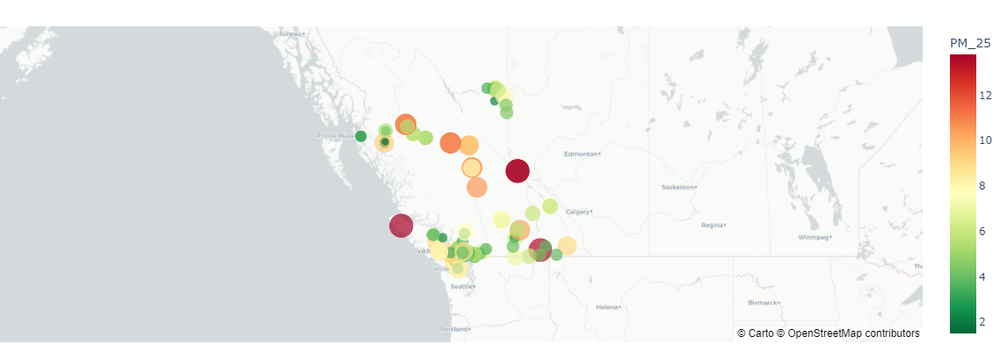

In [12]:
fig = px.scatter_mapbox(pm25, lat="Lat", lon="Lon", color="PM_25", size="PM_25",
                        color_continuous_scale="RdYlGn_r",
                        center={"lat": 52.261, "lon": -123.246}, zoom=3.5,
                        mapbox_style="carto-positron", hover_name="Station Name")
fig.update_layout(margin=dict(l=0, r=0, t=30, b=10)) # left. right, top, bottom
fig.show()

The goal is to interpolate these point measurements to estimate the air pollution for all of BC.

### 2.1. Deterministic spatial interpolation

Create surfaces directly from measured points using a mathematical function. Common techniques (all available in the [scipy](https://docs.scipy.org/doc/scipy/tutorial/index.html) module [interpolate](https://docs.scipy.org/doc/scipy/tutorial/interpolate.html) are:

- Inverse distance weighted interpolation
- Nearest neighbour interpolation
- Polynomial interpolation
- Radial basis function (RBF) interpolation

Let's try nearest neighbour interpolation now using [scipy.interpolate.NearestNDInterpolator](https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.NearestNDInterpolator.html#scipy.interpolate.NearestNDInterpolator). As angular coordinates (lat/lon) are not good for measuring distances, I'm going to first convert my data to the linear, meter-based Lambert projection recommend by Statistics Canada.

### Derivation of projected Easting and Northing coordinates from a point with geographical coordinates (lat, lon)

>Note: These formulas have been transcribed from EPSG Guidance Note #7-2. Users are encouraged to use that document rather than the text which follows as reference because limitations in the transcription will be avoided.

To derive the projected Easting and Northing coordinates of a point with geographical coordinates (lat,lon) the formulas for the one standard parallel case are:

    E = EF + r sin(theta)
    N = NF + rF - r cos(theta)
    where
    m = cos(lat)/(1 - e^2 sin^2(lat))^0.5     for m1, lat1, and m2, lat2 where lat1 and lat2 are the latitudes of the two standard parallels.
    t  = tan(pi/4 - lat/2)/[(1 - e sin(lat))/(1 + e sin(lat))]^(e/2)   for t1, t2, tF and t using lat1, lat2, latF and lat respectively.
    n = (loge(m1) - loge(m2))/(loge(t1) - loge(t2))
    F = m1/(n  t1^n)
    r =  a F t^n         for rF and r, where rF is the radius of the parallel of latitude of the false origin.
    theta = n(lon - lon0)

In [15]:
# create a geopandas Data by creating a geography column from the Lon and Lat column values
gpm25 = (gpd.GeoDataFrame(pm25, crs="EPSG:4326", geometry=gpd.points_from_xy(pm25["Lon"], pm25["Lat"]))
            .to_crs("EPSG:3347") # reproject 
        )

# extract the `x` and `y` locations as columns in my `GeoDataFrame` ("Easting" and "Northing" respectively
gpm25["Easting"], gpm25["Northing"] = gpm25.geometry.x, gpm25.geometry.y
gpm25.head()

,Station Name,Lat,Lon,EMS ID,PM_25,geometry,Easting,Northing
0,Abbotsford A Columbia Street,49.021500,-122.326600,E289309,4.7,POINT (4056511.036 1954658.126),4.056511e+06,1.954658e+06
1,Abbotsford Central,49.042800,-122.309700,E238212,4.6,POINT (4058698.814 1956191.109),4.058699e+06,1.956191e+06
2,Agassiz Municipal Hall,49.238032,-121.762334,E293810,6.7,POINT (4104120.445 1957264.772),4.104120e+06,1.957265e+06
3,Burnaby South,49.215300,-122.985600,E207418,3.8,POINT (4023977.036 1996103.398),4.023977e+06,1.996103e+06
4,Burns Lake Fire Centre,54.230700,-125.764300,E225267,5.4,POINT (4128403.079 2571148.393),4.128403e+06,2.571148e+06


Now let's create a grid of values (a [raster](https://pl.wikipedia.org/wiki/Raster_(poligrafia))) to interpolate over. I'm just going to make a square grid of fixed resolution that spans the bounds of my observed data points (we'll plot this shortly so you can see what it looks like):

In [16]:
resolution = 25_000  # cell size in meters
gridx = np.arange(gpm25.bounds.minx.min(), gpm25.bounds.maxx.max(), resolution)
gridy = np.arange(gpm25.bounds.miny.min(), gpm25.bounds.maxy.max(), resolution)

So now let's interpolate using a nearest neighbour method (the code below is straight from the [scipy docs](https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.NearestNDInterpolator.html)):

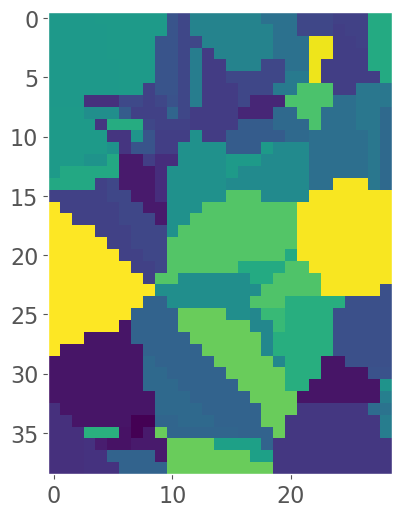

In [17]:
model = NearestNDInterpolator(x = list(zip(gpm25["Easting"], gpm25["Northing"])),
                              y = gpm25["PM_25"])
z = model(*np.meshgrid(gridx, gridy))
plt.imshow(z);

Okay so it looks like we successfully interpolated our made-up grid, but let's re-project it back to our original map. To do this I need to convert each cell in my raster to a small polygon using a simple function I wrote called `pixel2poly()` which we imported at the beginning of the notebook:

In [18]:
# convert each cell in raster to a small polygon
polygons, values = pixel2poly(gridx, gridy, z, resolution)

In [19]:
# convert to a GeoDataFrame
pm25_model = (gpd.GeoDataFrame({"PM_25_modelled": values}, geometry=polygons, crs="EPSG:3347")
                 .to_crs("EPSG:4326")
             )

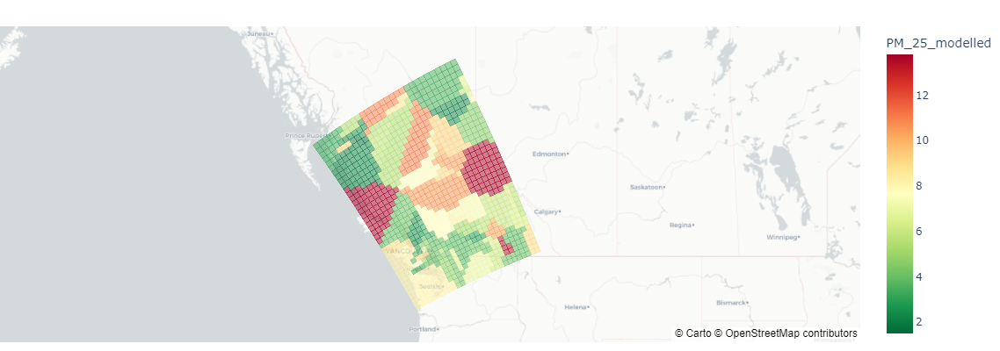

In [20]:
# plot using plotly
fig = px.choropleth_mapbox(pm25_model, geojson=pm25_model.geometry, locations=pm25_model.index,
                           color="PM_25_modelled", color_continuous_scale="RdYlGn_r", opacity=0.5,
                           center={"lat": 52.261, "lon": -123.246}, zoom=3.5,
                           mapbox_style="carto-positron")

fig.update_layout(margin=dict(l=0, r=0, t=30, b=10))
fig.update_traces(marker_line_width=0)

Very neat! Also, notice how the grid distorts a bit once we project it back onto an angular (degrees-based) projection from our linear (meter-based) projection.

### 2.2. Probabilistic (geostatistical) spatial interpolation

Geostatistical interpolation (called "Kriging") differs to deterministic interpolation in that we interpolate using statistical models that include estimates of spatial autocorrelation. There's a lot to read about [kriging](https://desktop.arcgis.com/en/arcmap/10.3/tools/3d-analyst-toolbox/how-kriging-works.htm), I just want you to be aware of the concept in case you need to do something like this in the future. Usually I'd do this kind of interpolation in GIS software like ArcGIS or QGIS, but it's possible to do in Python too.

The basic idea is that if we have a set of observations $Z(s)$ at locations $s$, we estimate the value of an unobserved location ($s_0$) as a weighted sum:
$$\hat{Z}(s_0)=\sum_{i=0}^{N}\lambda_iZ(s_i)$$

Where $N$ is the size of $s$ (number of observed samples) and $\lambda$ is an array of weights. The key is deciding which weights $\lambda$ to use. Kriging uses the spatial autocorrelation in the data to determine the weights. Spatial autocorrelation is calculated by looking at the squared difference (the variance) between points at similar distances apart, let's see what that means:

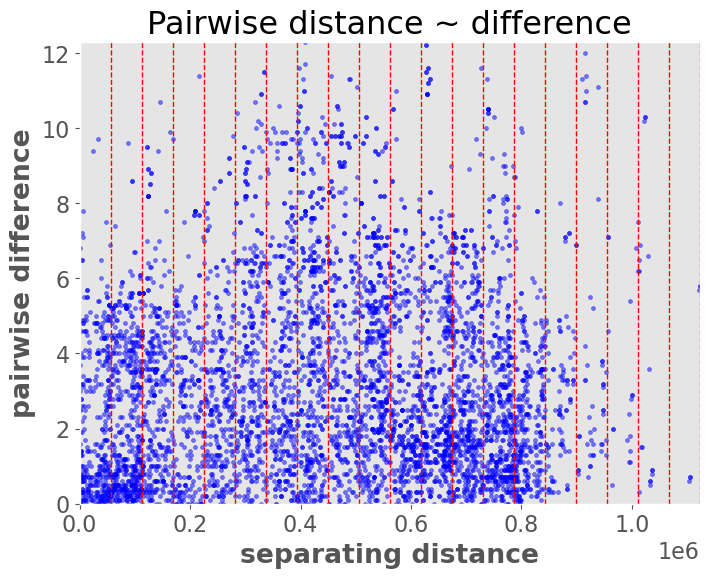

In [21]:
warnings.filterwarnings("ignore")  # Silence some warnings


vario = Variogram(coordinates=gpm25[["Easting", "Northing"]],
                  values=gpm25["PM_25"],
                  n_lags=20)
vario.distance_difference_plot();

The idea is to then fit a model to this data that describes how variance (spatial autocorrelation) changes with distance ("lag") between locations. We look at the average variance in bins of the above distances/pairs and fit a line through them. This model is called a [variogram](https://en.wikipedia.org/wiki/Variogram) and it's analogous to the [autocorrelation function](https://en.wikipedia.org/wiki/Autocorrelation) for time series. 

`It defines the variance (autocorrelation structure) as a function of distance:`

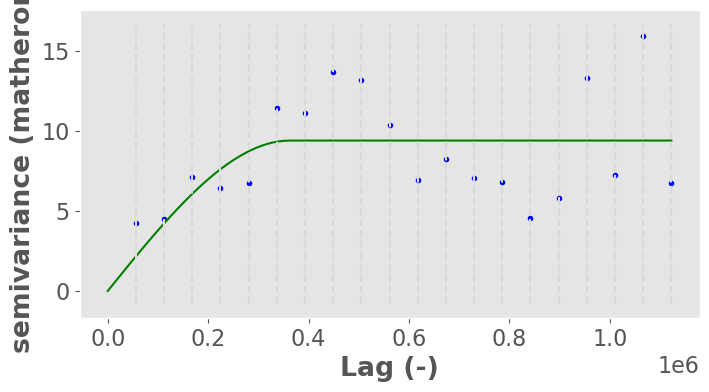

In [23]:
vario.plot(hist=False);

The above plot basically shows that:
- at small distances (points are close together), variance is reduced because points are correlated
- but at a distance around 400,000 m the variance flattens out indicating points are too far away to have any impactful spatial autocorrelation. This location is called the "range" while the variance at the "range" is called the "sill" (like a ceiling). We can extract the exact range:

In [22]:
# extract the range
vario.describe()["effective_range"]

363018.9087896692

By the way, we call it the semi-variance because there is a factor of 0.5 in the equation to account for the fact that variance is calculated twice for each pair of points ([read more here](https://www.aspexit.com/en/variogram-and-spatial-autocorrelation/)).

Remember, our variogram defines the spatial autocorrelation of the data (i.e., how the locations in our region affect one another). Once we have a variogram model, we can use it to `estimate the weights` in our kriging model. I won't go into detail on how this is done, but there is a neat walkthrough in the [scikit-gstat docs here](https://scikit-gstat.readthedocs.io/en/latest/userguide/kriging.html).

Anyway, I'll briefly use the [pykrige](https://github.com/GeoStat-Framework/PyKrige) library to do some kriging so you can get an idea of what it looks like:

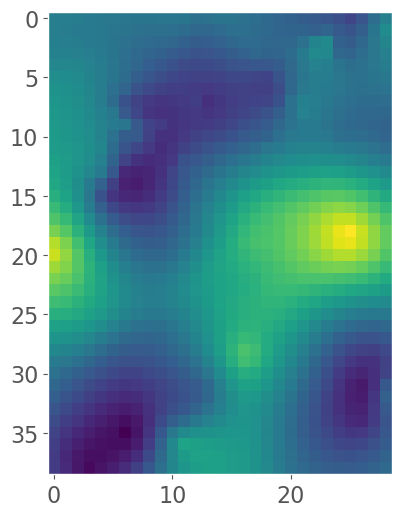

In [24]:
krig = OrdinaryKriging(x=gpm25["Easting"], y=gpm25["Northing"], z=gpm25["PM_25"], variogram_model="spherical")
z, ss = krig.execute("grid", gridx, gridy)
plt.imshow(z);

Now let's convert our raster back to polygons so we can map it. I'm also going to load in a polygon of BC using `osmnx` to clip my data so it fits nicely on my map this time:

In [25]:
# convert our raster back to polygons 
polygons, values = pixel2poly(gridx, gridy, z, resolution)

# create a GeoPandas DataFrame
pm25_model = (gpd.GeoDataFrame({"PM_25_modelled": values}, geometry=polygons, crs="EPSG:3347")
                 .to_crs("EPSG:4326")
                 )

In [26]:
# load in a polygon of BC
bc = ox.geocode_to_gdf("British Columbia, Canada")

# clip data to fit map
pm25_model = gpd.clip(pm25_model, bc)

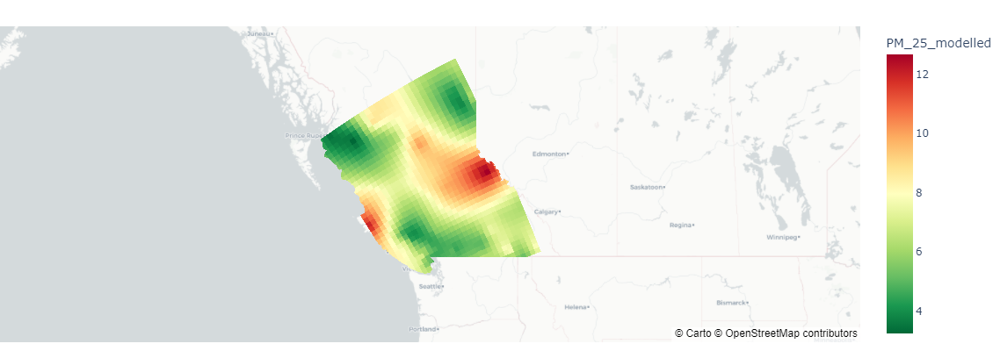

In [27]:
# visualize 
fig = px.choropleth_mapbox(pm25_model, geojson=pm25_model.geometry, locations=pm25_model.index,
                           color="PM_25_modelled", color_continuous_scale="RdYlGn_r",
                           center={"lat": 52.261, "lon": -123.246}, zoom=3.5,
                           mapbox_style="carto-positron")
fig.update_layout(margin=dict(l=0, r=0, t=30, b=10))
fig.update_traces(marker_line_width=0)

I used an "ordinary kriging" interpolation above which is the simplest implementation of kriging. The are many other forms of kriging too that can account for underlying trends in the data ("universal kriging"), or even use a regression or classification model to make use of additional explanatory variables. `pykrige` [supports most variations](https://geostat-framework.readthedocs.io/projects/pykrige/en/stable/examples/index.html). In particular for the latter, `pykrige` can accept `sklearn` models which is useful!

### 2.3. Areal interpolation

Areal interpolation is concerned with mapping data from one polygonal representation to another. Imagine I want to map the air pollution polygons I just made to FSA polygons (recall FSA is "forward sortation area", which are groups of postcodes). The most intuitive way to do this is to distribute values based on area proportions, hence "areal interpolation".

I'll use the [tobler](https://github.com/pysal/tobler) library for this. First, load in the FSA polygons:

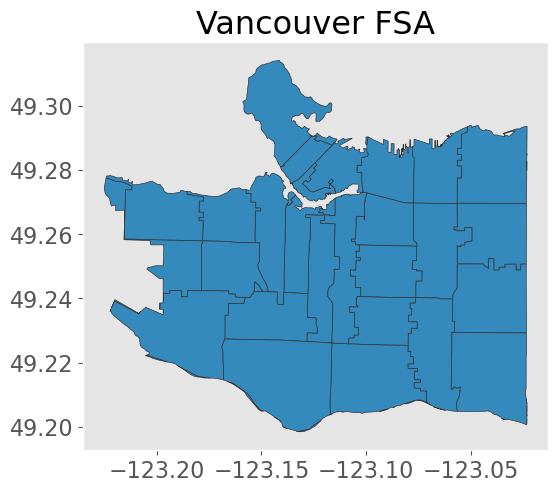

In [28]:
# load in the FSA polygons
van_fsa = gpd.read_file("data-spatial/van-fsa")
ax = van_fsa.plot(edgecolor="0.2")
plt.title("Vancouver FSA");

Now I'm just going to made a higher resolution interpolation using kriging so we can see some of the details on an FSA scale:

In [32]:
resolution = 10_000  # cell size in meters, higher res - previously was 25_000

gridx = np.arange(gpm25.bounds.minx.min(), gpm25.bounds.maxx.max(), resolution)
gridy = np.arange(gpm25.bounds.miny.min(), gpm25.bounds.maxy.max(), resolution)
krig = OrdinaryKriging(x=gpm25["Easting"], y=gpm25["Northing"], z=gpm25["PM_25"], variogram_model="spherical")
z, ss = krig.execute("grid", gridx, gridy)


In [33]:
# # convert our raster back to polygons
polygons, values = pixel2poly(gridx, gridy, z, resolution)

# create a GeoPandas DataFrame
pm25_model = (gpd.GeoDataFrame({"PM_25_modelled": values}, geometry=polygons, crs="EPSG:3347")
                 .to_crs("EPSG:4326")
                 )

Now we can easily do the areal interpolation using the function `area_interpolate()`:

In [34]:
# areal interpolation 
areal_interp = area_interpolate(pm25_model.to_crs("EPSG:3347"),
                                van_fsa.to_crs("EPSG:3347"),
                                intensive_variables=["PM_25_modelled"]).to_crs("EPSG:4326")

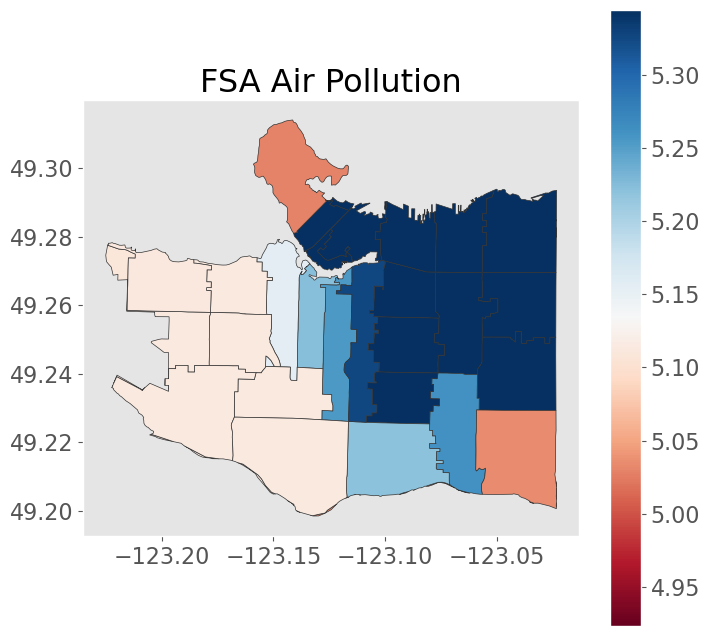

In [35]:
# visualization 
areal_interp.plot(column="PM_25_modelled", figsize=(8, 8),
                  edgecolor="0.2", cmap="RdBu", legend=True)
plt.title("FSA Air Pollution");

There are other methods you can use for areal interpolation too, that include additional variables or use more advanced interpolation algorithms. The [tobbler documentation](https://pysal.org/tobler/) describes some of these.